## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## 1. Compute the camera calibration using chessboard images

In [1]:
#Some Imports
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import math
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import warnings

%matplotlib inline

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/skimage/filter/__init__.py:6: skimage_deprecation: The `skimage.filter` module has been renamed to `skimage.filters`.  This placeholder module will be removed in v0.13.
  warn(skimage_deprecation('The `skimage.filter` module has been renamed '


('image: ', 'camera_cal/calibration1.jpg')
('image: ', 'camera_cal/calibration10.jpg')


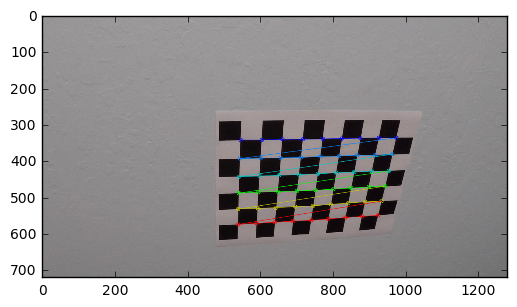

('image: ', 'camera_cal/calibration11.jpg')


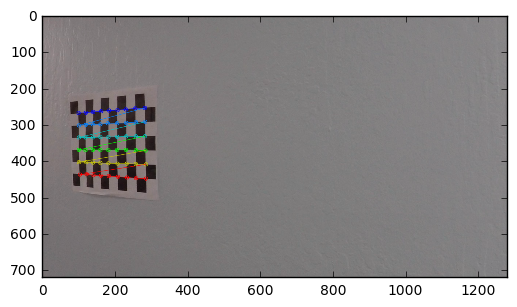

('image: ', 'camera_cal/calibration12.jpg')


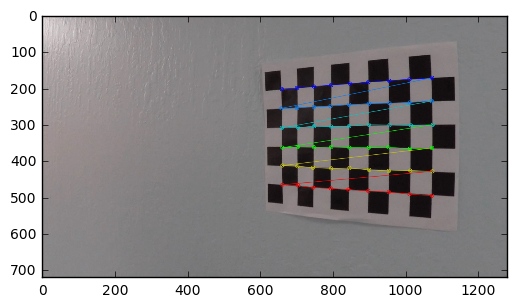

('image: ', 'camera_cal/calibration13.jpg')


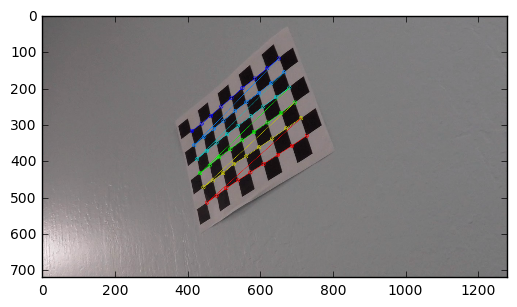

('image: ', 'camera_cal/calibration14.jpg')


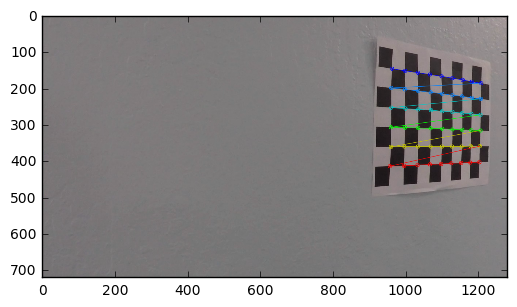

('image: ', 'camera_cal/calibration15.jpg')


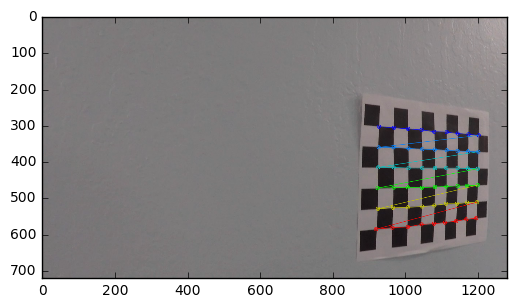

('image: ', 'camera_cal/calibration16.jpg')


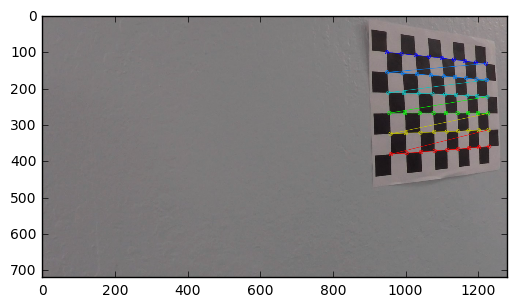

('image: ', 'camera_cal/calibration17.jpg')


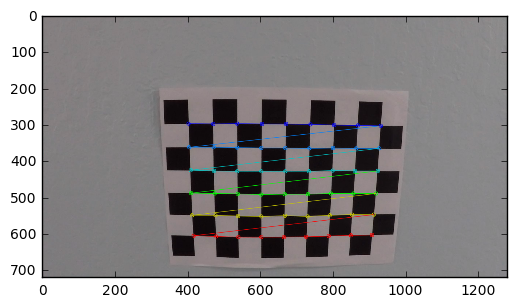

('image: ', 'camera_cal/calibration18.jpg')


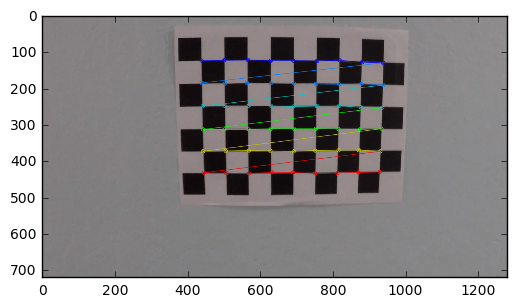

('image: ', 'camera_cal/calibration19.jpg')


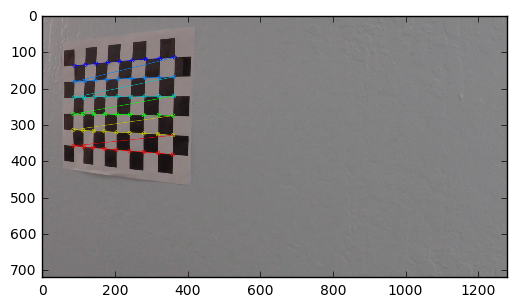

('image: ', 'camera_cal/calibration2.jpg')


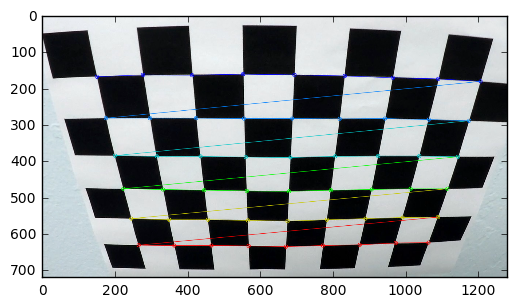

('image: ', 'camera_cal/calibration20.jpg')


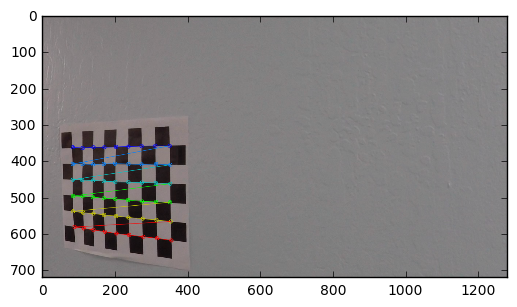

('image: ', 'camera_cal/calibration3.jpg')


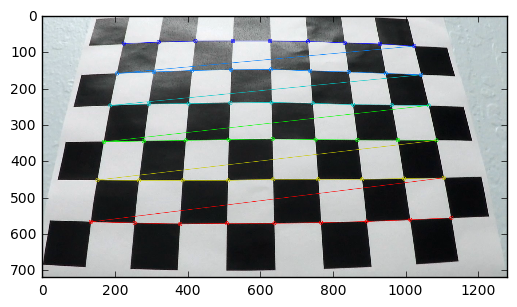

('image: ', 'camera_cal/calibration4.jpg')
('image: ', 'camera_cal/calibration5.jpg')
('image: ', 'camera_cal/calibration6.jpg')


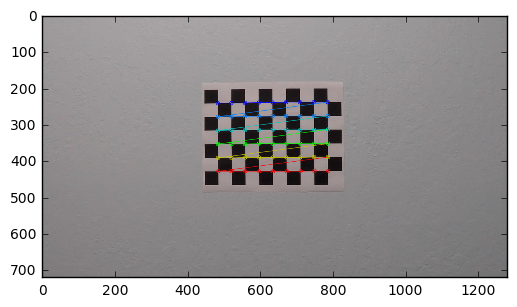

('image: ', 'camera_cal/calibration7.jpg')


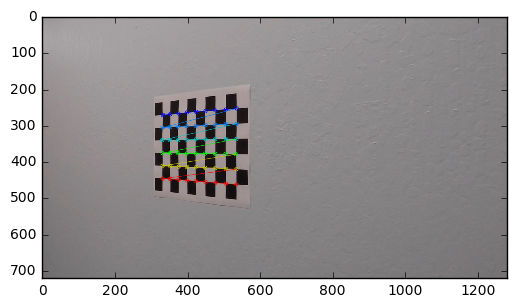

('image: ', 'camera_cal/calibration8.jpg')


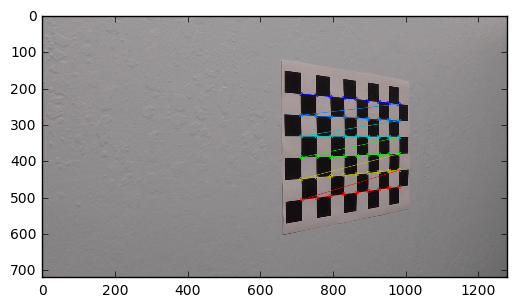

('image: ', 'camera_cal/calibration9.jpg')


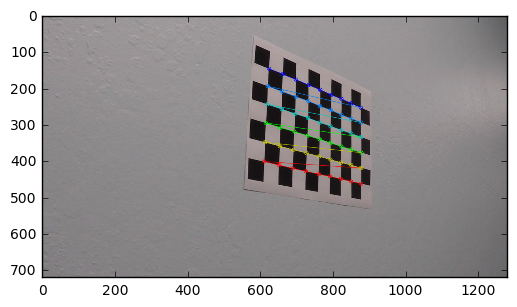

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.


# Make a list of calibration images
cal_images = glob.glob('camera_cal/calibration*.jpg')
# Step through the list and search for chessboard corners
for fname in cal_images:
    img = cv2.imread(fname)
    img_size = (img.shape[1], img.shape[0])

    print("image: ", fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        img_corners = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        
        plt.imshow(img)
        plt.show()
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
        #print(ret, mtx, dist, rvecs, tvecs)
        

## 2-1. Apply a distortion correction to chessboard images.

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera and cv2.undistort()
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

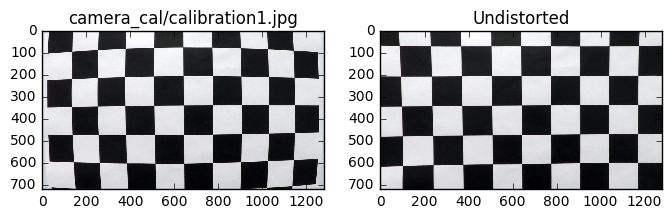

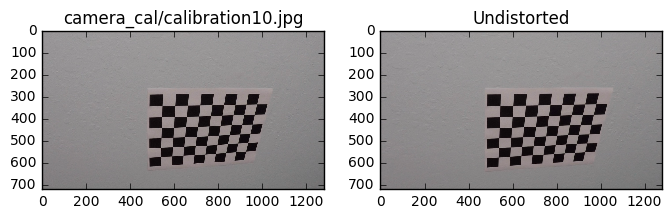

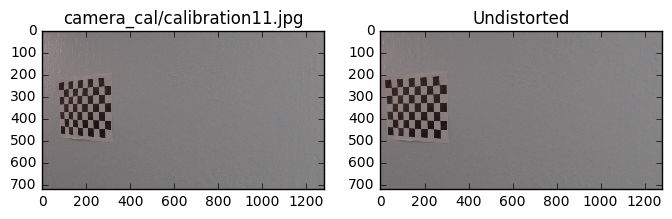

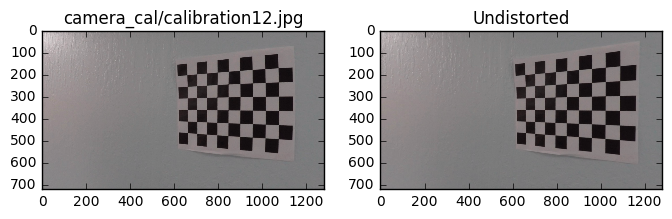

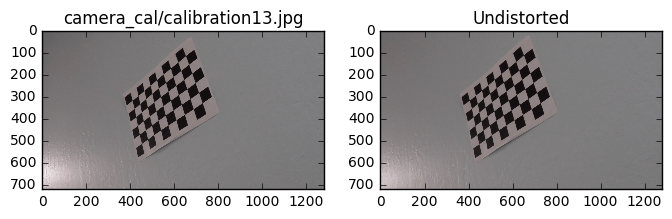

...

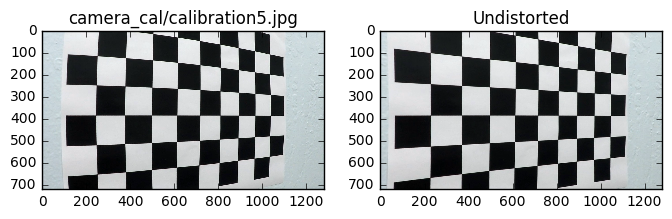

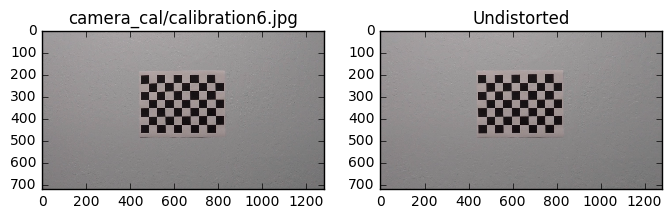

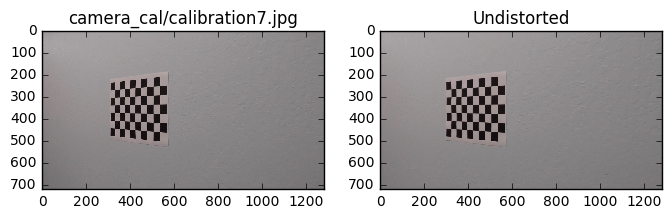

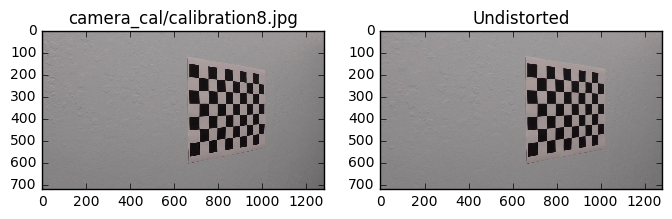

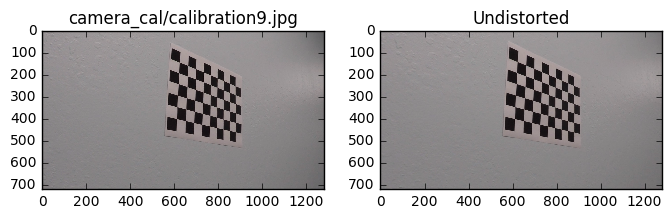

In [4]:
for fname in cal_images:
    img = cv2.imread(fname)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(img)
    ax1.set_title(fname)
    ax2.imshow(cal_undistort(img, objpoints, imgpoints))
    ax2.set_title('Undistorted')
    

## 2-2. Apply a distortion correction to chessboard images.

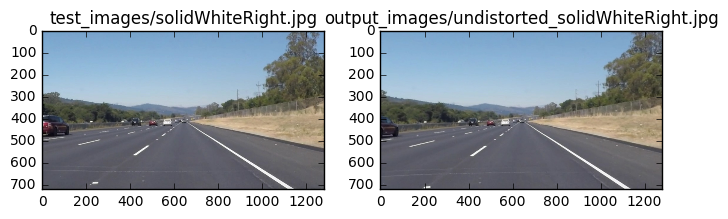

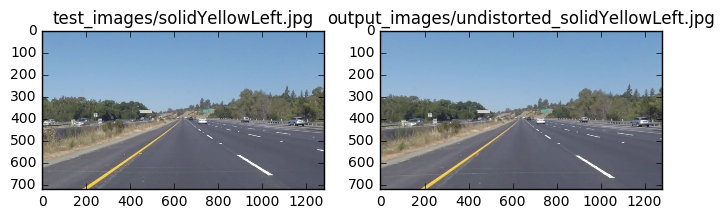

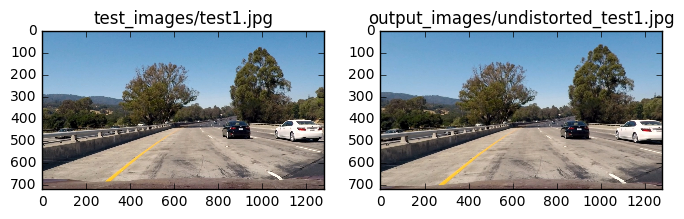

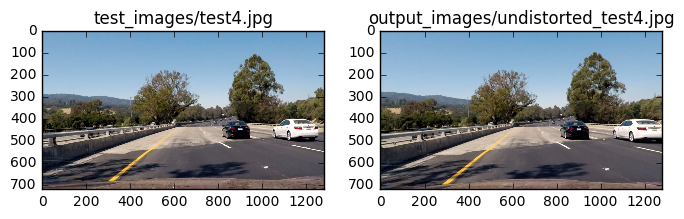

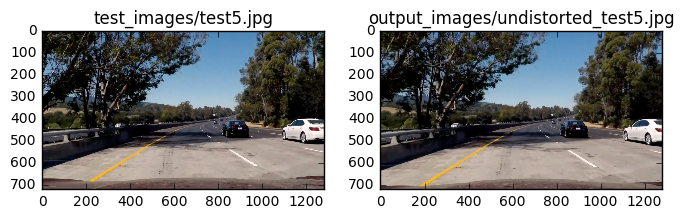

...

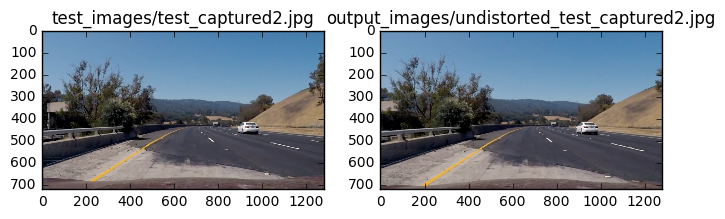

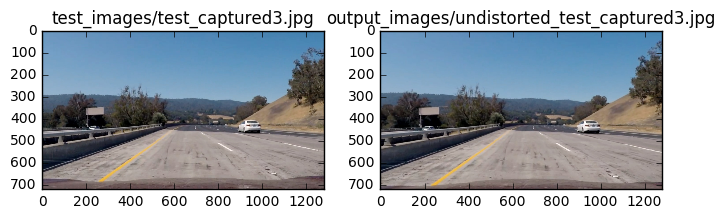

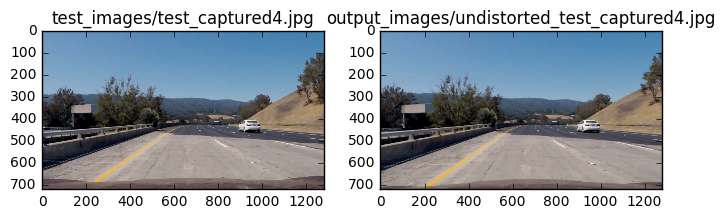

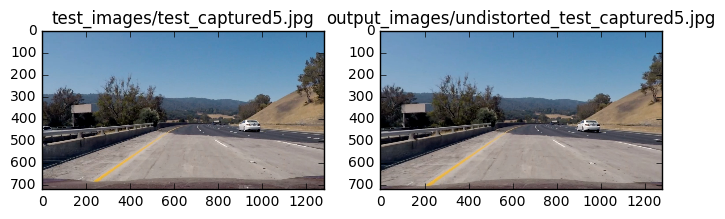

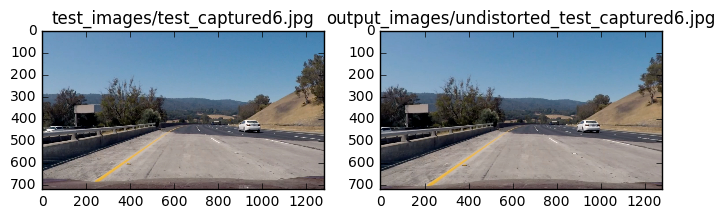

In [23]:

test_images = glob.glob('test_images/*.jpg')
output_folder = 'output_images'

for fname in test_images:
    img = cv2.imread(fname)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title(fname)
    
    out_fname = os.path.join(output_folder, "undistorted_%s"%os.path.basename(fname))
    undistorted=cal_undistort(img, objpoints, imgpoints)
    ax2.imshow( cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title(out_fname)
    
    cv2.imwrite(out_fname, undistorted)


## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

In [24]:
#implement most of the basic image processing functionalities in class thresholded_img

In [25]:
def get_lane_pixels(img):
    
    img_shape = img.shape
    leftx = []
    lefty = []
    rightx = []
    righty = []
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            #print img[y,x]
            if img[y,x] > 0:
                if (x <= img_shape[1]/2):
                    leftx.append(x)
                    lefty.append(y)
                else:
                    rightx.append(x)
                    righty.append(y)
    return leftx, lefty, rightx, righty

In [60]:
class thresholded_img():
    def __init__(self):
        self.reset()
        
    def reset(self):
        warnings.warn("reset thresholded_img class")
        self.imshape = (720,1280)
        self.blur_kernel_size = 5
        self.canny_low_threshold = 40
        self.canny_high_threshold = 200
        
        self.warp_src = np.float32([[540, 470],[750, 470],
                      [1130, 690],[200, 690]])
        self.warp_dst = np.float32([[200, 0], [1080, 0], 
                     [1080, 720],[200, 720]]) 
        
        self.vert_ratio = [ [0.15,0.0], #top left
                            [0.15,1.0], #bottom left
                            [0.30,1.0],[0.5,0.00],[0.70,1.0], #/\
                            [0.85,1.0], #bottom right
                            [0.85,0.0]] #top right
        self.set_region_vertices()
        
        self.leftfit = []
        self.rightfit = []
        self.set_keep_fit_record = 3
        self.averaged_leftfit = None
        self.averaged_rightfit = None
        
        self.good_fit_left = False
        self.good_fit_right = False
        
        self.is_fresh = True
        
        return 
    
    def get_edges(self):
        yval = 0
        top_left = np.multiply(self.averaged_leftfit[0],np.power(yval,2)) + np.multiply(self.averaged_leftfit[1],yval) + self.averaged_leftfit[2]
        top_right = np.multiply(self.averaged_rightfit[0],np.power(yval,2)) + np.multiply(self.averaged_rightfit[1],yval) + self.averaged_rightfit[2]
        yval = self.imshape[1]
        bottom_left = np.multiply(self.averaged_leftfit[0],np.power(yval,2)) + np.multiply(self.averaged_leftfit[1],yval) + self.averaged_leftfit[2]
        bottom_right = np.multiply(self.averaged_rightfit[0],np.power(yval,2)) + np.multiply(self.averaged_rightfit[1],yval) + self.averaged_rightfit[2]
        return top_left,top_right,bottom_left,bottom_right
    
    def append_prev_edge_points(self, leftx, lefty, rightx, righty):
        try:
            top_left,top_right,bottom_left,bottom_right = self.get_edges()

            leftx.append(top_left)
            lefty.append(0)
            leftx.append(bottom_left)
            lefty.append(self.imshape[1])

            rightx.append(top_right)
            righty.append(0)
            rightx.append(bottom_right)
            righty.append(self.imshape[1])
        except:
            pass
        return leftx, lefty, rightx, righty
    
    def set_dynimic_region_vertices(self):
        if self.good_fit_left and self.good_fit_right:
            #getting x intercept at top and buttom of frame
            x_range = self.imshape[0] * 0.05
            vert_ratio = self.vert_ratio
            
            top_left,top_right,bottom_left,bottom_right = self.get_edges()
            
            self.region_vertices = np.array([[(top_left - x_range              , self.imshape[0]*vert_ratio[0][1]),
                                              (bottom_left - x_range           , self.imshape[0]*vert_ratio[1][1]), 

                                              (bottom_left + x_range           , self.imshape[0]*vert_ratio[2][1]), 
                                              (self.imshape[1]*vert_ratio[3][0], self.imshape[0]*vert_ratio[3][1]), 
                                              (bottom_right - x_range          , self.imshape[0]*vert_ratio[4][1]), 

                                              (bottom_right + x_range          , self.imshape[0]*vert_ratio[5][1]), 
                                              (top_right + x_range             , self.imshape[0]*vert_ratio[6][1])
                                             ]], dtype=int)
        else:
            pass
        return
    
    def set_leftfit(self, new_leftfit):
        if new_leftfit is None:
            self.good_fit_left = False
            if len(self.leftfit) > 0:
                _=self.leftfit.pop()
        else:
            self.leftfit.insert(0,new_leftfit)
        
        if len(self.leftfit) > self.set_keep_fit_record:
            _=self.leftfit.pop()
        
        if len(self.leftfit) > 0:
            self.averaged_leftfit = np.mean(self.leftfit,axis = 0).tolist()
        
        return self.averaged_leftfit
        
    def set_rightfit(self, new_rightfit):
        if new_rightfit is None:
            self.good_fit_right = False
            if len(self.rightfit) > 0:
                _=self.rightfit.pop()
        else:
            self.rightfit.insert(0,new_rightfit)
        
        if len(self.rightfit) > self.set_keep_fit_record:
            _=self.rightfit.pop()
        
        if len(self.rightfit) > 0:
            self.averaged_rightfit = np.mean(self.rightfit,axis = 0).tolist()
        
        return self.averaged_rightfit

    
    def set_warp_points(self, warp_src, warp_dst):
        self.warp_src = warp_src
        self.warp_dst = warp_dst 
    
    def abs_sobel_thresh(self, img, sobel_kernel=3, orient='x', thresh=[0,255]):
        # Convert to grayscale
        #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply x or y gradient with the OpenCV Sobel() function
        # and take the absolute value
        if orient == 'x':
            abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
        if orient == 'y':
            abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
        # Rescale back to 8 bit integer
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        # Create a copy and apply the threshold
        binary_output = np.zeros_like(scaled_sobel)
        # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
        binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

        # Return the result
        return binary_output

    def mag_thresh(self, img, sobel_kernel=3, thresh=(30, 255)):
        
        # 2) Take the gradient in x and y separately
        sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        # 3) Calculate the magnitude 
        gradmag = np.sqrt(sobelx**2 + sobely**2)
        # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
        scaled_sobel = np.uint8(255*gradmag/np.max(gradmag))
        # 6) Create a binary mask where mag thresholds are met
        sxbinary = np.zeros_like(scaled_sobel)
        sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        
        # 7) Return this mask as your binary_output image
        binary_output = np.copy(img) # Remove this line
        return sxbinary
    
    def dir_threshold(self, img, sobel_kernel=15, thresh=(0, np.pi/2)):
        # Apply the following steps to img
        # 1) Convert to grayscale
        #img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # 2) Take the gradient in x and y separately
        sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        # 3) Take the absolute value of the x and y gradients
        abs_sobelx = np.absolute(sobelx)
        abs_sobely = np.absolute(sobely)
        # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
        gradient = np.arctan2(abs_sobely, abs_sobelx)
        # 5) Create a binary mask where direction thresholds are met
        sbinary = np.zeros_like(gradient)
        sbinary[(gradient >= thresh[0]) & (gradient <= thresh[1])] = 1
        # 6) Return this mask as your binary_output image
        return sbinary
    
    def gaussian_blur(self, img, kernel_size):
        """Applies a Gaussian Noise kernel"""
        return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

    def region_of_interest(self, img, vertices):
        """
        Applies an image mask.

        Only keeps the region of the image defined by the polygon
        formed from `vertices`. The rest of the image is set to black.
        """
        #defining a blank mask to start with
        mask = np.zeros_like(img)   

        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (1,) * channel_count
        else:
            ignore_mask_color = 1

        #filling pixels inside the polygon defined by "vertices" with the fill color    
        cv2.fillPoly(mask, vertices, ignore_mask_color)

        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        
        return masked_image

    def hls_select(self, img, thresh=(0, 255), channel=2):
        # 1) Convert to HLS color space
        S = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,channel]
        # 2) Apply a threshold to the S channel
        binary_output = S.copy()
        binary_output[(S < thresh[0]) | (S > thresh[1])] = 0
        # 3) Return a binary image of threshold result
        return binary_output

    def red_select(self, img, thresh=(0, 255)):
        # 1) Convert to HLS color space
        R = img[:,:,2]
        # 2) Apply a threshold to the S channel
        binary_output = R.copy()
        binary_output[(S < thresh[0]) | (S > thresh[1])] = 0
        # 3) Return a binary image of threshold result
        return binary_output
    
    def yCrCb_select(self, img, thresh=(0, 255), channel=0):
        # 1) Convert to HLS color space
        S = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)[:,:,channel]
        # 2) Apply a threshold to the S channel
        binary_output = S.copy()
        binary_output[(S < thresh[0]) | (S > thresh[1])] = 0
        # 3) Return a binary image of threshold result
        return binary_output
    
    
    def set_region_vertices(self): 
        vert_ratio = self.vert_ratio
        vert_ratio = self.vert_ratio
        #self.imshape = img.shape
        self.region_vertices = np.array([[(self.imshape[1]*vert_ratio[0][0], self.imshape[0]*vert_ratio[0][1]),
                                          (self.imshape[1]*vert_ratio[1][0], self.imshape[0]*vert_ratio[1][1]), 
                                          (self.imshape[1]*vert_ratio[2][0], self.imshape[0]*vert_ratio[2][1]), 
                                          #(self.imshape[1]*vert_ratio[3][0], self.imshape[0]*vert_ratio[3][1])
                                          (self.imshape[1]*vert_ratio[3][0], self.imshape[0]*vert_ratio[3][1]), 
                                          (self.imshape[1]*vert_ratio[4][0], self.imshape[0]*vert_ratio[4][1]), 
                                          (self.imshape[1]*vert_ratio[5][0], self.imshape[0]*vert_ratio[5][1]), 
                                          (self.imshape[1]*vert_ratio[6][0], self.imshape[0]*vert_ratio[6][1])
                                         ]]
                                        , dtype=np.int32)
        #self.region_vertices = np.array([[(0,0),
        #                                  (0,720), 
        #                                  (1280,720),
        #                                  (1280,0)]], dtype=np.int32)
        
    def get_thresholded_single_channel(self, img, gradx_thresh = (40, 255),
                                                  grady_thresh = (10, 255),
                                                  mag_threh = (30,255),
                                                  dir_thresh = (0.65,1.5)):
        blurred = self.gaussian_blur(img, self.blur_kernel_size)
        #edges = self.canny(blurred, self.canny_low_threshold, self.canny_high_threshold)
        
        gradx = self.abs_sobel_thresh(blurred, orient='x', sobel_kernel=3, thresh=gradx_thresh)
        grady = self.abs_sobel_thresh(blurred, orient='y', sobel_kernel=3, thresh=grady_thresh)
        mag_binary = self.mag_thresh(blurred, sobel_kernel=3, thresh=mag_threh)
        dir_binary = self.dir_threshold(blurred, sobel_kernel=15, thresh=dir_thresh)
        
        combined = np.zeros_like(dir_binary)
        combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) ] = 1
        #combined[((mag_binary == 1) & (dir_binary == 1)) ] = 1
        return combined
        
    def get_thresholded(self, img):
        #y channel for white line
        y_binary = self.get_thresholded_single_channel(self.yCrCb_select(img, thresh=(200,255), channel=0)
                                                                                    , mag_threh = (20,255))
        y_binary = self.gaussian_blur(y_binary, 3)
        
        #Cb channel for yellow line
        cb_binary = self.get_thresholded_single_channel(self.yCrCb_select(img, thresh=(50,255), channel=2)
                                                                                    , mag_threh = (160,255))
        cb_binary = self.gaussian_blur(cb_binary, 3)
        
        #using hue to filter out shadows
        h_binary = self.get_thresholded_single_channel(self.hls_select(img, channel=0), 
                                                      mag_threh = (3,255)
                                                      )
        h_binary = self.gaussian_blur(h_binary, 3)
        
        
        # Combine the two binary thresholds
        combined_binary = np.zeros_like(y_binary)
        combined_binary[((y_binary > (20.0/25)) | (cb_binary > (22.0/25))) & (h_binary > 1.0/25)] = 1
        
        return combined_binary
        
    def warp_img(self, img):
        M = cv2.getPerspectiveTransform(self.warp_src, self.warp_dst)
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
        return warped
    
    def unwarp_img(self, img):
        M = cv2.getPerspectiveTransform(self.warp_dst, self.warp_src)
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
        return warped
    
    def dynamic_tighten_region(self, img):
        #try to restrain search position again, just around median x value.
        leftx, lefty, rightx, righty = get_lane_pixels(img)
        x_range_pixels = 100
        if len(leftx) > 0:
            median_leftx = np.median(leftx)
            self.region_vertices[0][0][0] = median_leftx - x_range_pixels
            self.region_vertices[0][1][0] = median_leftx - x_range_pixels
            self.region_vertices[0][2][0] = median_leftx + x_range_pixels
        if len(rightx) > 0:
            median_rightx = np.median(rightx)
            self.region_vertices[0][4][0] = median_rightx - x_range_pixels
            self.region_vertices[0][5][0] = median_rightx + x_range_pixels
            self.region_vertices[0][6][0] = median_rightx + x_range_pixels

        region_masked = self.region_of_interest(img, self.region_vertices)
        return img
    
    def get_thresh_warp_img(self, img):
        if len(self.leftfit) == 0 or len(self.leftfit) == 0 :
            self.reset()
        
        #self.set_region_vertices(img)
        
        threholded = self.get_thresholded(img)
        warpped = self.warp_img(threholded)
        region_masked = self.region_of_interest(warpped, self.region_vertices)
        
        if self.is_fresh:
            region_masked = self.dynamic_tighten_region(region_masked)
            
        return region_masked

ti = thresholded_img()

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class


In [61]:
#function to test the effect of region masking
def test_mask_region(vertices):
    
    tmp_img = np.ones([720,1280])
    tmp_img[0,0] = 0

    #ti.set_region_vertices(tmp_img)
    #print ti.region_vertices
    tmp_img = ti.region_of_interest(tmp_img, vertices)
    plt.imshow(tmp_img, cmap='gray')
    plt.show()


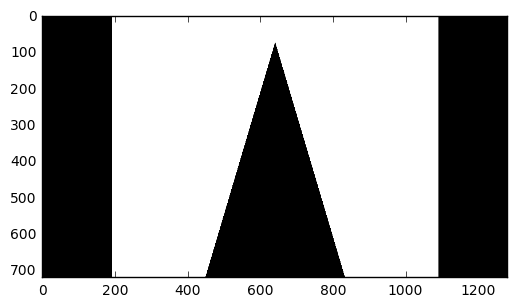

In [62]:
#test the effect of region maskin                    
test_mask_region(  np.array([[(192,0),
                              (192,720),
                              (448,720),
                              (640,72),
                              (832,720),
                              (1088,720),
                              (1088,0)]])
                    )


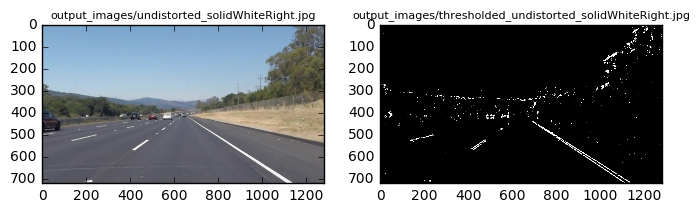

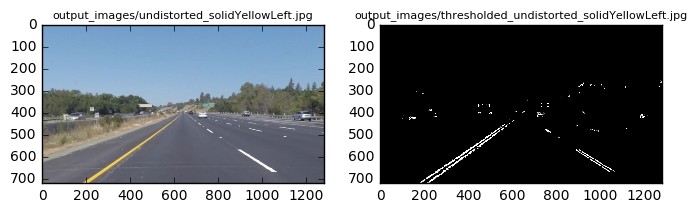

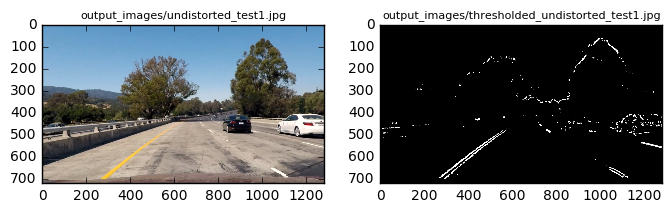

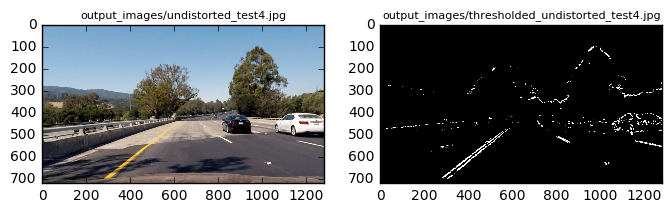

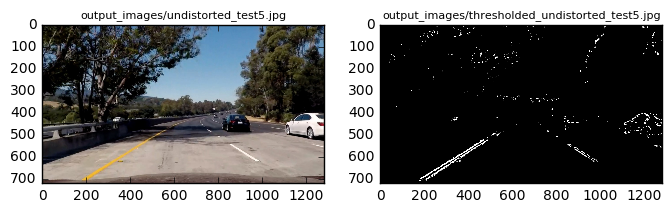

...

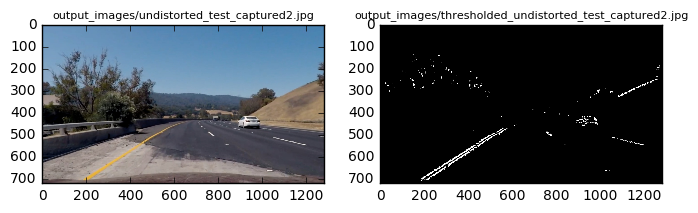

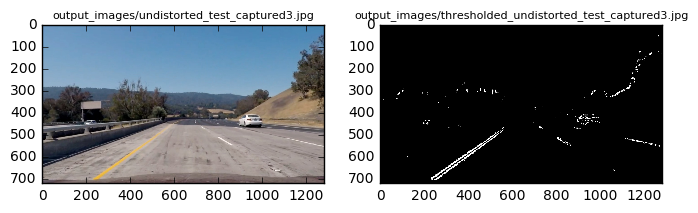

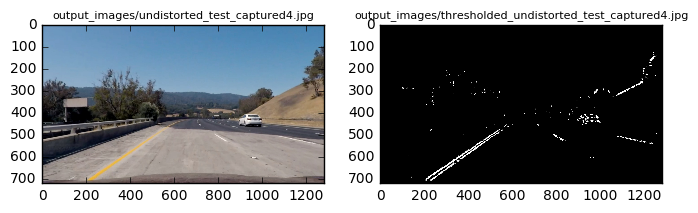

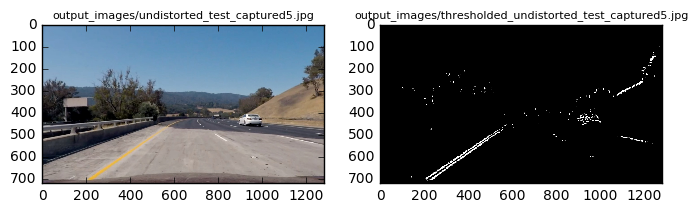

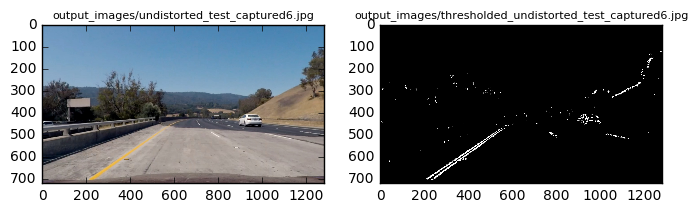

In [63]:
test_images = glob.glob('output_images/undistorted_*.jpg')
output_folder = 'output_images'

for fname in test_images:
    img = cv2.imread(fname)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title(fname, fontsize=8)
    
    out_fname = os.path.join(output_folder, "thresholded_%s"%os.path.basename(fname))
    thresholded = ti.get_thresholded(img)
    ax2.imshow( thresholded, cmap='gray')
    ax2.set_title(out_fname, fontsize=8)
    
    cv2.imwrite(out_fname, thresholded)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

In [64]:
ti.set_warp_points(np.float32([[540, 470],[750, 470],
                      [1130, 690],[200, 690]]),
                  np.float32([[200, 0], [1080, 0], 
                     [1080, 720],[200, 720]]) 
                  )


/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class


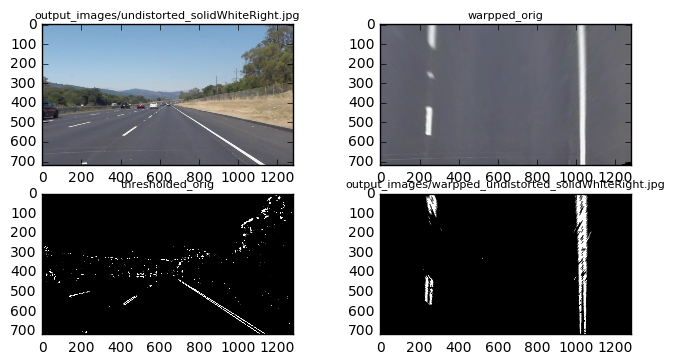

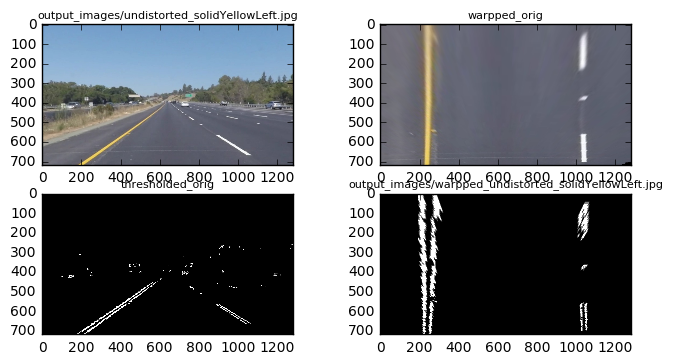

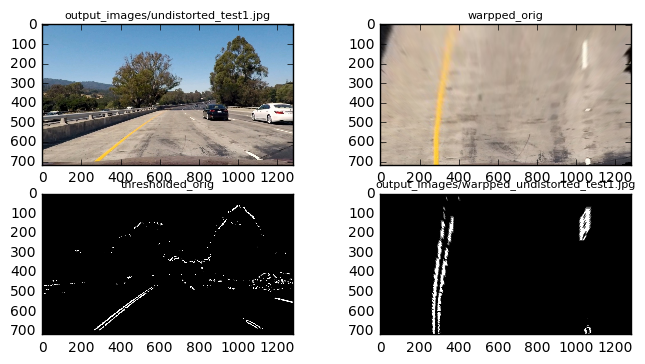

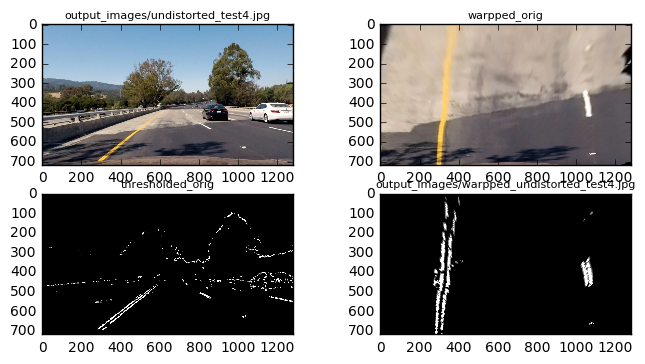

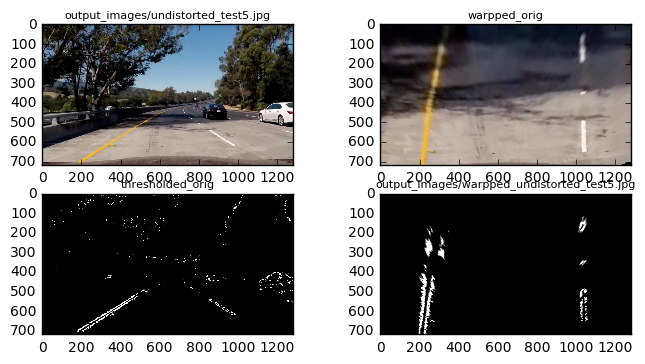

...

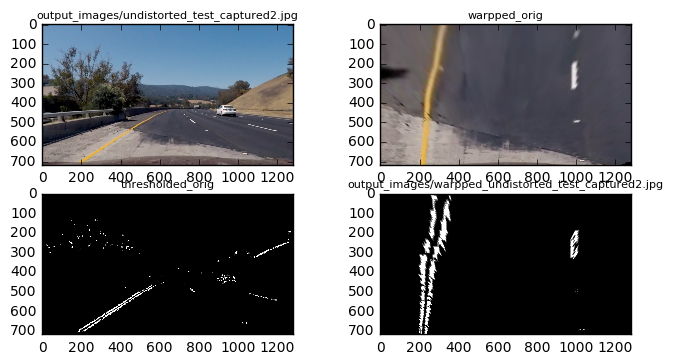

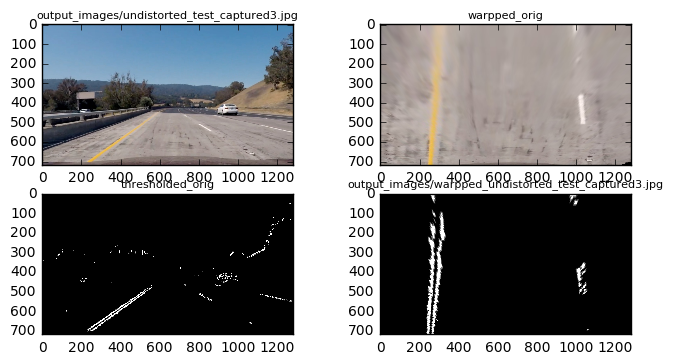

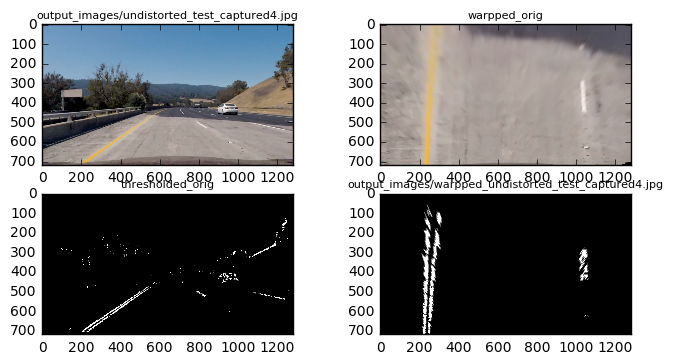

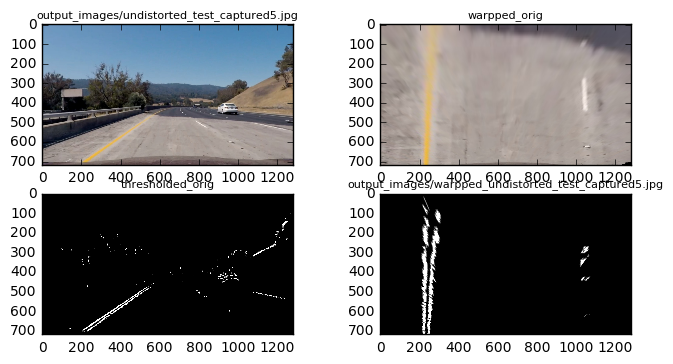

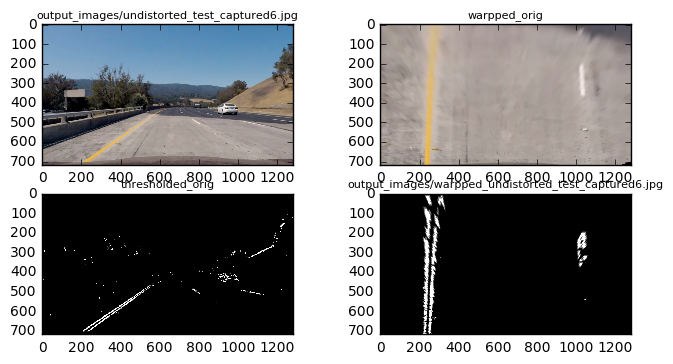

In [65]:
test_images = glob.glob('output_images/undistorted_*.jpg')
output_folder = 'output_images'

for fname in test_images:
    #ti.reset()
    img = cv2.imread(fname)
    
    fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title(fname, fontsize=8)
    
    warpped = ti.warp_img(img)
    ax2.imshow(cv2.cvtColor(warpped, cv2.COLOR_BGR2RGB))   
    ax2.set_title("warpped_orig", fontsize=8)
    
    thresholded = ti.get_thresholded(img)
    ax3.imshow( thresholded, cmap='gray')
    ax3.set_title("thresholded_orig", fontsize=8)
    
    #result = ti.get_thresholded(warpped)
    thresholded_warpped = ti.get_thresh_warp_img(img)
    out_fname = os.path.join(output_folder, "warpped_%s"%os.path.basename(fname))
    ax4.imshow( thresholded_warpped, cmap='gray')
    ax4.set_title(out_fname, fontsize=8)
    
    cv2.imwrite(out_fname, thresholded_warpped)
    

## 5. Detect lane pixels and fit to find the lane boundary.

In [66]:
#def get_lane_pixels(img):
#moved to part 3

def fit_line(img, thresholded_img_class):
    thresholded_warpped = thresholded_img_class.get_thresh_warp_img(img)
    leftx, lefty, rightx, righty = get_lane_pixels(thresholded_warpped)
    leftx, lefty, rightx, righty = ti.append_prev_edge_points(leftx, lefty, rightx, righty )
    # Fit a second order polynomial to each fake lane line
    yvals = range(720)
    try:
        left_fit = np.polyfit(lefty, leftx, 2)
        left_fit = ti.set_leftfit(left_fit)
        left_fitx = np.multiply(left_fit[0],np.power(yvals,2)) + np.multiply(left_fit[1],yvals) + left_fit[2]
    except:
        left_fit = ti.set_leftfit(None)
        left_fitx = np.multiply(left_fit[0],np.power(yvals,2)) + np.multiply(left_fit[1],yvals) + left_fit[2]
    
    try:
        right_fit = np.polyfit(righty, rightx, 2)
        right_fit = ti.set_rightfit(right_fit)
        right_fitx = np.multiply(right_fit[0],np.power(yvals,2)) + np.multiply(right_fit[1],yvals) + right_fit[2]
    except:
        right_fit = ti.set_rightfit(None)
        right_fitx = np.multiply(right_fit[0],np.power(yvals,2)) + np.multiply(right_fit[1],yvals) + right_fit[2]
    
    return left_fit, right_fit, left_fitx, right_fitx, leftx, lefty, rightx, righty, yvals
    
    #plt.plot(leftx, lefty, 'o', color='red')
    #plt.plot(rightx, righty, 'o', color='blue')
    #plt.xlim(0, 1280)
    #plt.ylim(0, 720)
    #plt.plot(left_fitx, lefty, color='green', linewidth=3)
    #plt.plot(right_fitx, righty, color='green', linewidth=3)
    #plt.gca().invert_yaxis() # to visualize as we do the images
    

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class


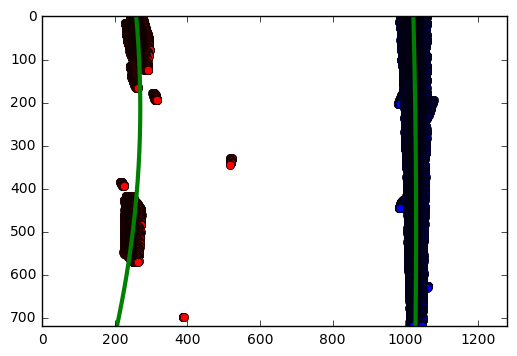

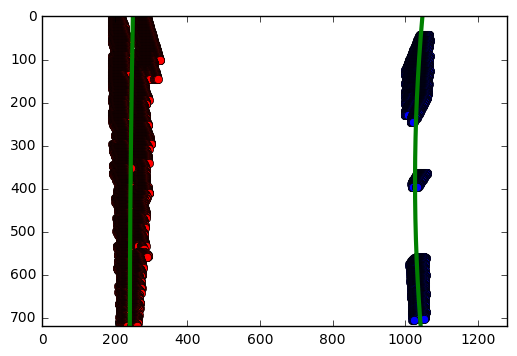

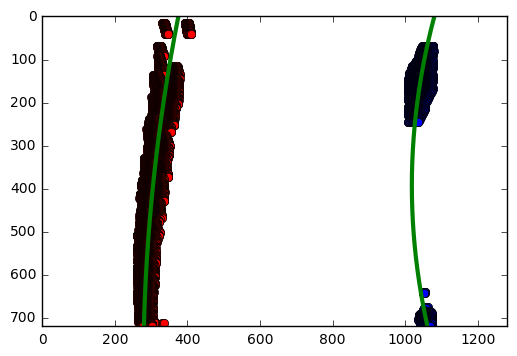

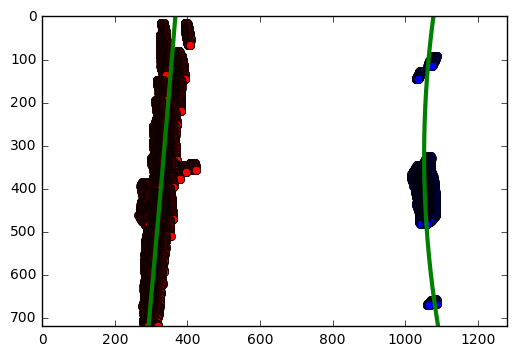

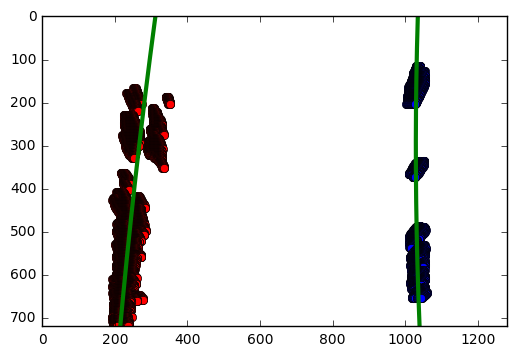

...

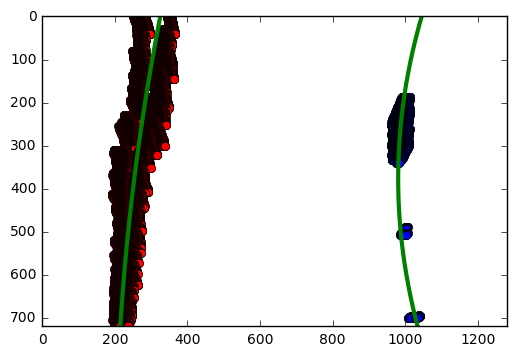

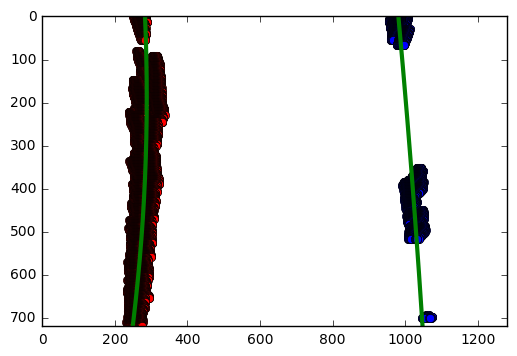

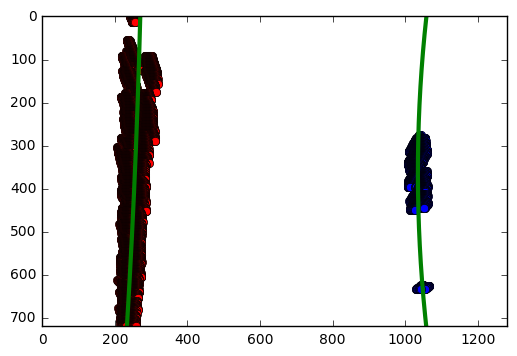

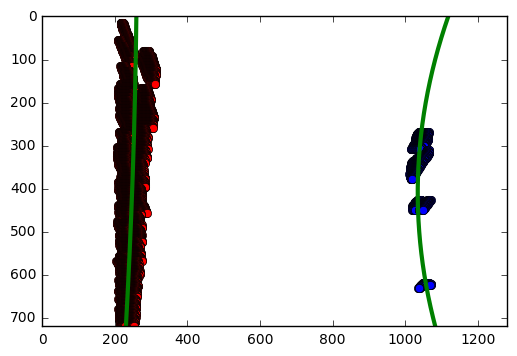

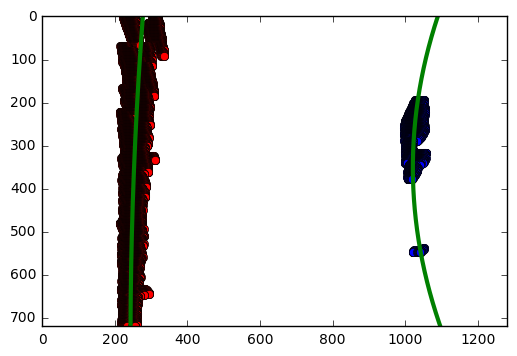

In [67]:

test_images = glob.glob('output_images/undistorted_*.jpg')

for fname in test_images:
    img = cv2.imread(fname)
    ti.reset()
    
    left_fit, right_fit, left_fitx, right_fitx, leftx, lefty, rightx, righty, yvals = fit_line(img, ti)
    
    plt.plot(leftx, lefty, 'o', color='red')
    plt.plot(rightx, righty, 'o', color='blue')
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.plot(left_fitx, yvals, color='green', linewidth=3)
    plt.plot(right_fitx, yvals, color='green', linewidth=3)
    plt.gca().invert_yaxis() # to visualize as we do the images
    
    plt.show()
    

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [68]:
def get_curves(img, thresholded_img_class):
    left_fit, right_fit, left_fitx, right_fitx, leftx, lefty, rightx, righty, yvals = fit_line(img, thresholded_img_class)
    
    
    
    '''
    left_curverad = ((1 + (2*left_fit[0]*y_eval_left + left_fit[1])**2)**1.5) \
                             /np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval_right + right_fit[1])**2)**1.5) \
                                /np.absolute(2*right_fit[0])
    '''
    
    ym_per_pix = 30.0/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    
    if len(lefty) > 1:
        y_eval_left = np.max(lefty)
        left_fit_cr  = np.polyfit(np.multiply(lefty, ym_per_pix).tolist(), 
                                  np.multiply(leftx, xm_per_pix).tolist(), 2)
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_left*ym_per_pix + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    else: 
        y_eval_left = None
        left_fit_cr = None
        left_curverad = None
        
    if len(righty) > 1:
        y_eval_right = np.max(righty)
        right_fit_cr = np.polyfit(np.multiply(righty,ym_per_pix).tolist(),
                                  np.multiply(rightx,xm_per_pix).tolist(), 2)
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_right*ym_per_pix + right_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*right_fit_cr[0])
    else: 
        y_eval_right = None
        right_fit_cr = None
        right_curverad = None
    
    if len(lefty) > 1 and len(righty) > 1:
        lane_offset = (1280/2 - (left_fitx[-1]+right_fitx[-1])/2)*xm_per_pix
    else:
        lane_offset = 0
    return left_curverad, right_curverad, lane_offset, left_fit, right_fit, left_fitx, right_fitx, leftx, lefty, rightx, righty, yvals

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class


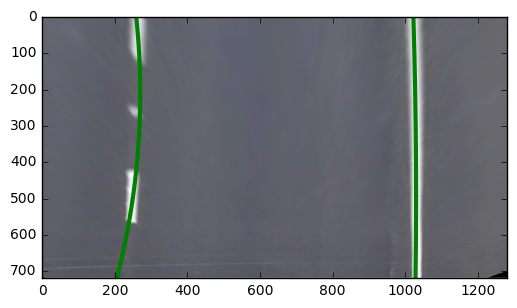

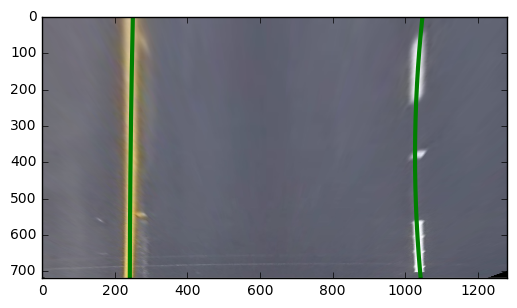

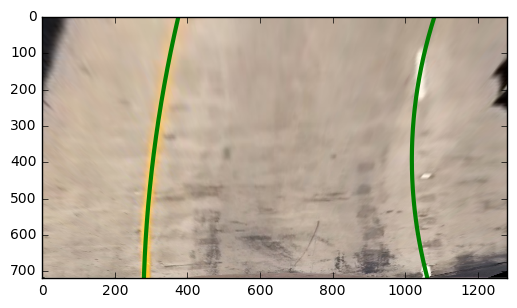

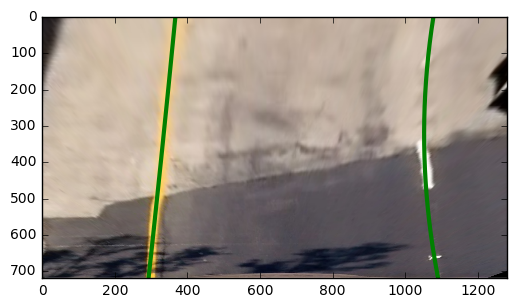

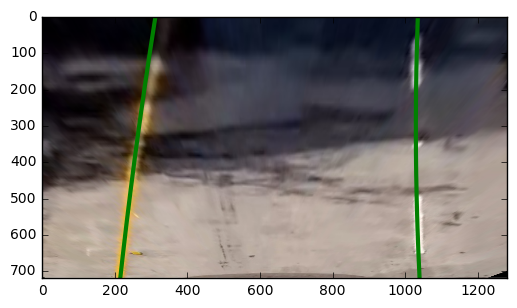

...

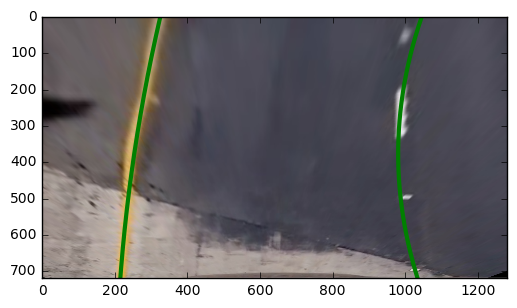

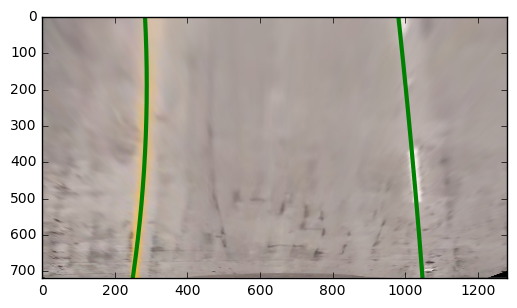

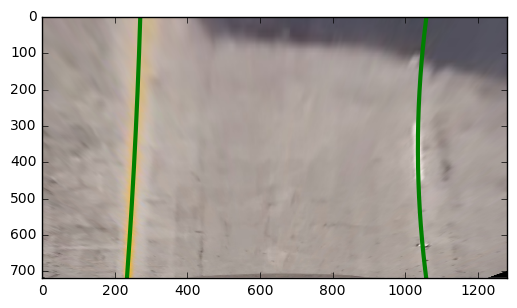

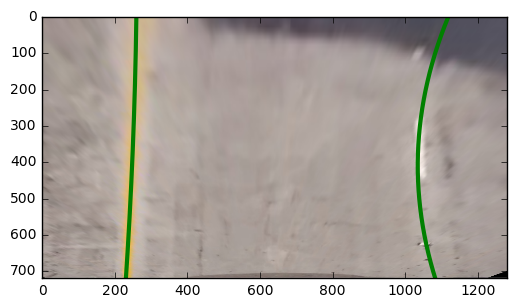

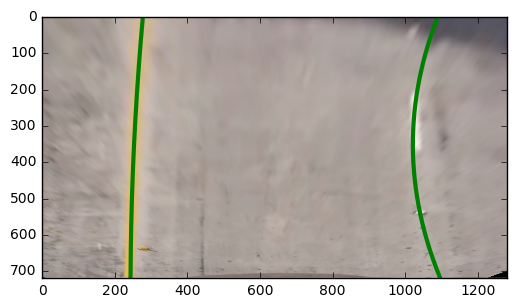

In [69]:
test_images = glob.glob('output_images/undistorted_*.jpg')

img = None
for fname in test_images:
    img = cv2.imread(fname)
    ti.reset()
    left_curverad, right_curverad, lane_offset, left_fit, right_fit, left_fitx, right_fitx, leftx, lefty, rightx, righty, yvals = get_curves(img, ti)
    curverad = (left_curverad + right_curverad)/2
    #print("left_curverad: %s m, right_curverad: %s m"%(left_curverad, right_curverad))
    #print("Radius of Curvature: %s"%curverad)
    #print("Lane Position: %s"%lane_offset)
    
    
    warpped = ti.warp_img(img)
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, yvals])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, yvals]))])
    lane_vertices = np.hstack((pts_left, pts_right))
    
    
    plt.imshow(cv2.cvtColor(warpped, cv2.COLOR_BGR2RGB)) 
    
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.plot(left_fitx, yvals, color='green', linewidth=3)
    plt.plot(right_fitx, yvals, color='green', linewidth=3)
    plt.gca().invert_yaxis() # to visualize as we do the images
    
    plt.show()
    
    

## 7. Warp the detected lane boundaries back onto the original image.

In [70]:

def anonate_img(img, thresholded_img_class = None):
    if thresholded_img_class is None:
        global ti  #using global since I don't know how to pass in the class into fl_image(). 
        thresholded_img_class = ti
    
    left_curverad, right_curverad, lane_offset, left_fit, right_fit, left_fitx, right_fitx, leftx, lefty, rightx, righty, yvals = get_curves(img, thresholded_img_class)
    
    try:
        curverad = (left_curverad + right_curverad)/2
        
        pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, yvals])))])
        pts_right = np.array([np.transpose(np.vstack([right_fitx, yvals]))])
        lane_vertices = np.hstack((pts_left, pts_right))

        lane_filling = np.zeros_like(warpped)
        cv2.fillPoly(lane_filling, np.int_([lane_vertices]), (0,255,0))
        unwarpped_lane_filling = thresholded_img_class.unwarp_img(lane_filling)
        lane_filled = cv2.addWeighted(img, 1, unwarpped_lane_filling, 0.5, 0)
        cv2.putText(lane_filled,"Radius of Curvature: %s"%curverad,(20,100), 
                    cv2.FONT_HERSHEY_SIMPLEX, 2,(255,255,255),4,cv2.LINE_AA)
        cv2.putText(lane_filled,"Lane Position: %s m"%lane_offset,(20,175), 
                    cv2.FONT_HERSHEY_SIMPLEX, 2,(255,255,255),4,cv2.LINE_AA)
    except:
        lane_filled = img
        #warnings.warn("fail to fit curve")
        cv2.putText(lane_filled,"fail to fit curve",(20,175), 
                    cv2.FONT_HERSHEY_SIMPLEX, 2,(255,255,255),4,cv2.LINE_AA)
    ti.set_dynimic_region_vertices()
    return lane_filled
    

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class


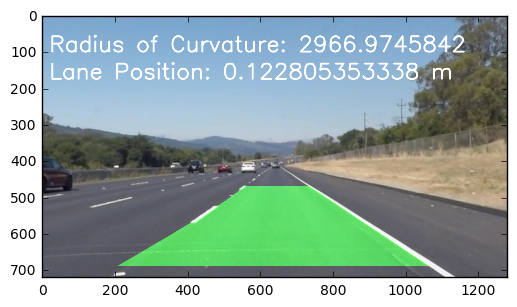

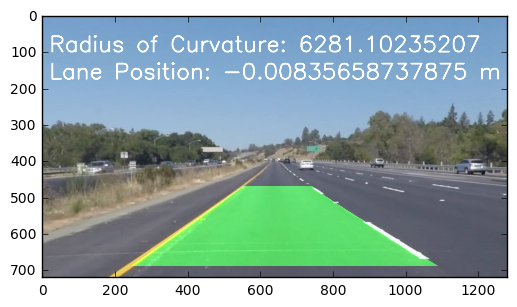

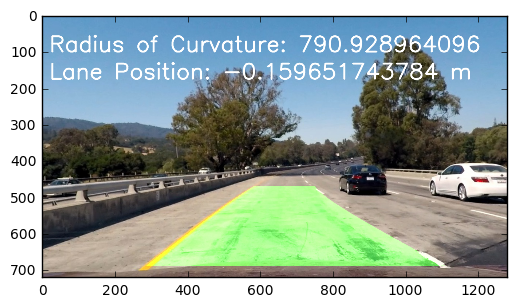

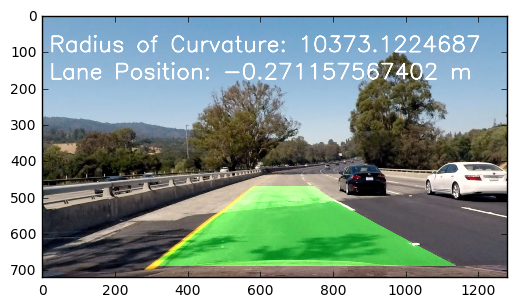

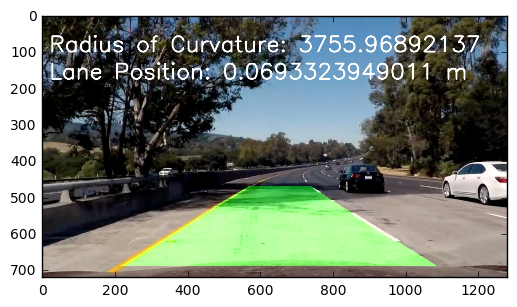

...

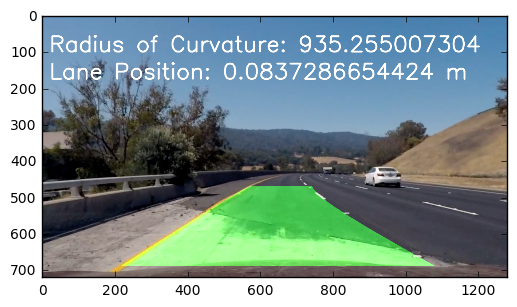

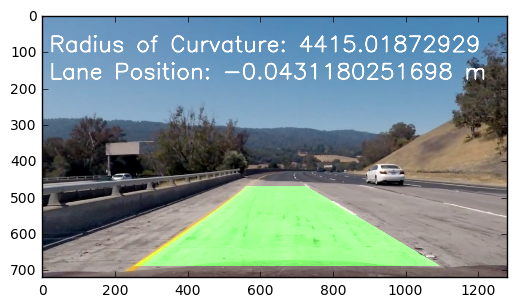

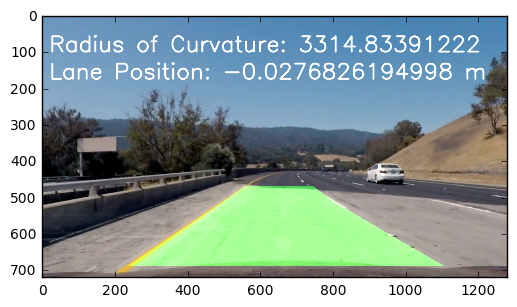

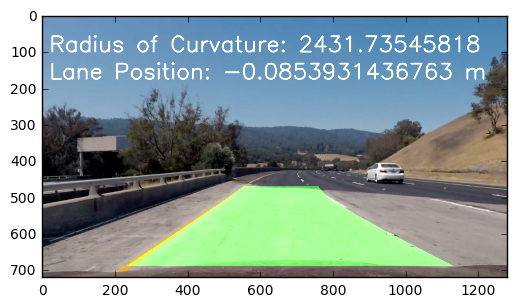

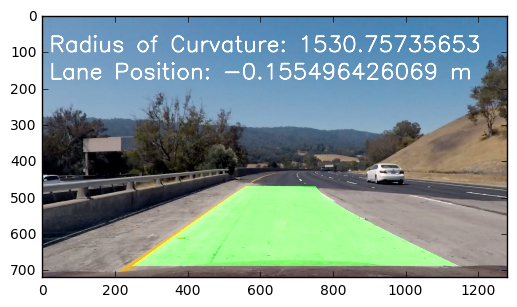

In [71]:
test_images = glob.glob('output_images/undistorted_*.jpg')
ti.reset()
img = None
for fname in test_images:
    #print ti.region_vertices
    img = cv2.imread(fname)
    ti.reset()
    
    annotated_img = anonate_img(img, ti)
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)) 
    plt.show()
    

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [72]:
ti.reset()
test_output = 'result.mp4'
clip1 = VideoFileClip('project_video.mp4')
yellow_clip = clip1.fl_image(anonate_img)
%time yellow_clip.write_videofile(test_output, audio=False)


/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class



MoviePy: building video file result.mp4
----------------------------------------

Writing video into result.mp4
Done writing video in result.mp4 !
Your video is ready !
CPU times: user 41min 13s, sys: 2min 27s, total: 43min 40s
Wall time: 23min 39s


## Display Video

In [73]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(test_output))

In [75]:
print test_output

result.mp4


## Challenge Video

In [76]:

ti.reset()
test_output = 'challenge_result.mp4'
clip1 = VideoFileClip('challenge_video.mp4')
yellow_clip = clip1.fl_image(anonate_img)
%time yellow_clip.write_videofile(test_output, audio=False)

HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(test_output))

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: reset thresholded_img class



MoviePy: building video file challenge_result.mp4
----------------------------------------

Writing video into challenge_result.mp4
|----------| 6/388   1% [elapsed: 00:06 left: 07:10,  0.89 iters/sec]

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


|----------| 7/388   1% [elapsed: 00:07 left: 07:10,  0.89 iters/sec]

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


|##--------| 111/388  28% [elapsed: 02:05 left: 05:13,  0.88 iters/sec]

/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/Users/benjamin.chang/anaconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


Done writing video in challenge_result.mp4 !
Your video is ready !
CPU times: user 12min 43s, sys: 45 s, total: 13min 28s
Wall time: 7min 20s
